<a href="https://colab.research.google.com/github/mellisairawan/OrbitFutureAcademy2/blob/main/Face_Mask_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **FACE MASK DETECTION**
by Mellisa Irawan

## **Import Library dan Dataset**

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
# Make connections to Kaggle
! pip install -q kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json 

In [ ]:
! kaggle datasets download ashishjangra27/face-mask-12k-images-dataset

 95% 315M/330M [00:03<00:00, 64.0MB/s]
100% 330M/330M [00:03<00:00, 93.0MB/s]


In [ ]:
! kaggle datasets download andrewmvd/face-mask-detection

100% 396M/398M [00:11<00:00, 38.6MB/s]
100% 398M/398M [00:11<00:00, 35.7MB/s]


In [ ]:
! kaggle datasets download vijaykumar1799/face-mask-detection #need to revise

 98% 217M/222M [00:06<00:00, 29.2MB/s]
100% 222M/222M [00:06<00:00, 33.8MB/s]


In [ ]:
import zipfile
dataset = ['/content/face-mask-12k-images-dataset.zip', '/content/face-mask-detection.zip'] #need to revise
for dataset_path in dataset:
  zip_ref = zipfile.ZipFile(dataset_path, "r")
  zip_ref.extractall()
  zip_ref.close()

## **Take a Look at The Sample Images**

In [ ]:
# Import Haarcascade for frontal face
import cv2
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')

(None, None, None)

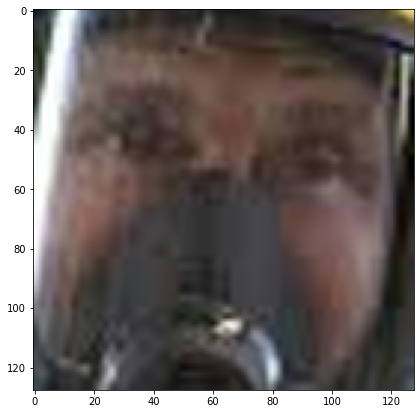

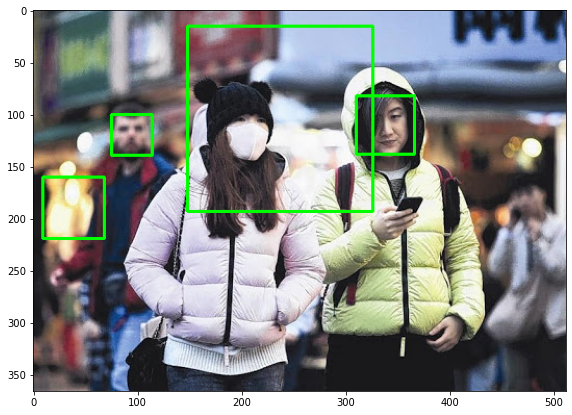

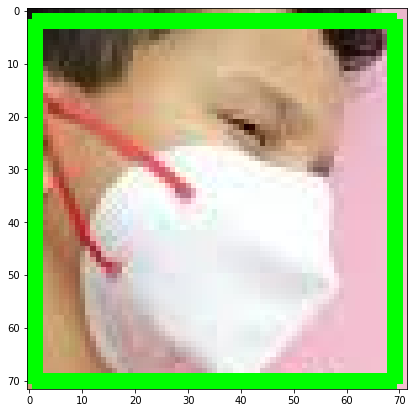

In [ ]:
# See image sample from the dataset
import matplotlib.pyplot as plt
sample_image = ['/content/Dataset/WithMask/1010.png', '/content/images/maksssksksss0.png', '/content/Face Mask Dataset/Train/WithMask/1037.png']

def show_face(image):
  fig = plt.figure(figsize=(10, 7))
  image = cv2.imread(image)
  image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  detections = face_detector.detectMultiScale(image_gray, scaleFactor=1.1, minNeighbors=2)
  output_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  for x, y, w, h in detections:
    cv2.rectangle(output_image, (x, y), (x+w, y+h), (0,255,0), 2)

  plt.imshow(output_image)

show_face(sample_image[0]), show_face(sample_image[1]), show_face(sample_image[2])

## **Building Prediction Model**

In [ ]:
# Importing VGG19 model for face mask detection
import tensorflow as tf
from keras.applications.vgg19 import VGG19
from keras.applications.vgg19 import preprocess_input
from keras import Sequential
from keras.preprocessing.image import ImageDataGenerator
import numpy as np

In [ ]:
# Load train, test, and validation directories
train_dir = '/content/Face Mask Dataset/Train'
test_dir = '/content/Face Mask Dataset/Test'
validation_dir = '/content/Face Mask Dataset/Validation'

In [ ]:
# Data Augmentation
BATCH_SIZE = 32
train_datagen = ImageDataGenerator(
    rescale=1./255.,
    horizontal_flip=True,
    zoom_range=0.2,
    shear_range=0.2
)
train_generator = train_datagen.flow_from_directory(
    directory=train_dir,
    target_size=(128,128),
    class_mode='categorical',
    batch_size=BATCH_SIZE
)

test_datagen = ImageDataGenerator(rescale=1./255.)
test_generator = test_datagen.flow_from_directory(
    directory=test_dir,
    target_size=(128,128),
    class_mode='categorical',
    batch_size=BATCH_SIZE
)

validation_datagen = ImageDataGenerator(rescale=1./255.)
validation_generator = validation_datagen.flow_from_directory(
    directory=validation_dir,
    target_size=(128,128),
    class_mode='categorical',
    batch_size=BATCH_SIZE
)

Found 10000 images belonging to 2 classes.
Found 992 images belonging to 2 classes.
Found 800 images belonging to 2 classes.


In [ ]:
# Building VGG19 model using transfer learning
pre_trained_model = VGG19(weights='imagenet',
              include_top=False,
              input_shape=(128,128,3))

for layer in pre_trained_model.layers:
  layer.trainable = False

model = Sequential()
model.add(pre_trained_model)
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(512, activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.Dense(128, activation='relu'))
model.add(tf.keras.layers.Dense(2, activation='softmax'))
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 4, 4, 512)         20024384  
                                                                 
 flatten_6 (Flatten)         (None, 8192)              0         
                                                                 
 dense_16 (Dense)            (None, 512)               4194816   
                                                                 
 dropout_6 (Dropout)         (None, 512)               0         
                                                                 
 dense_17 (Dense)            (None, 128)               65664     
                                                                 
 dense_18 (Dense)            (None, 2)                 258       
                                                                 
Total params: 24,285,122
Trainable params: 4,260,738
N

In [ ]:
# Create Callbacks
class Callback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('accuracy')>0.995):
      print("\nReached 99.5% accuracy so cancelling training!")
      self.model.stop_training=True

callback = Callback()

In [ ]:
model.compile(optimizer='Adam',
              loss='categorical_crossentropy',
              metrics='accuracy')

history = model.fit(train_generator,
                    steps_per_epoch= len(train_generator)//BATCH_SIZE,
                    epochs=50,
                    validation_data=validation_generator,
                    validation_steps=len(validation_generator)//BATCH_SIZE,
                    callbacks=[callback])

Epoch 1/50
9/9 [==============================] - 3s 223ms/step - loss: 1.0644 - accuracy: 0.6806
Epoch 2/50
9/9 [==============================] - 2s 209ms/step - loss: 0.2500 - accuracy: 0.8924
Epoch 3/50
9/9 [==============================] - 2s 207ms/step - loss: 0.2422 - accuracy: 0.9062
Epoch 4/50
9/9 [==============================] - 2s 208ms/step - loss: 0.1137 - accuracy: 0.9549
Epoch 5/50
9/9 [==============================] - 2s 206ms/step - loss: 0.1952 - accuracy: 0.9271
Epoch 6/50
9/9 [==============================] - 2s 204ms/step - loss: 0.1443 - accuracy: 0.9549
Epoch 7/50
9/9 [==============================] - 2s 207ms/step - loss: 0.1307 - accuracy: 0.9479
Epoch 8/50
9/9 [==============================] - 2s 206ms/step - loss: 0.1722 - accuracy: 0.9514
Epoch 9/50
9/9 [==============================] - 2s 210ms/step - loss: 0.1134 - accuracy: 0.9479
Epoch 10/50
9/9 [==============================] - 2s 207ms/step - loss: 0.0939 - accuracy: 0.9757
Epoch 11/50
9/9 [==

## **Testing and Validating the Prediction Results**

In [ ]:
# Testing the model into testing data
def PredictFaceMask(IMAGE_PATH):
  test_image = cv2.imread(IMAGE_PATH)
  test_image = cv2.resize(test_image, (128,128)) #as our model input_size is (128,128)
  fig = plt.figure(figsize=(5, 3))
  plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))

  test_image = np.reshape(test_image, [1, 128, 128, 3])/255. #change shape and resizing
  pred_result = model.predict(test_image)
  print(f"Prediction result is: {pred_result}")

Prediction result is: [[0.99569523 0.00430474]]


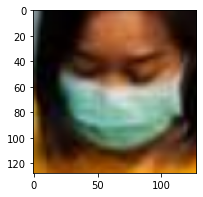

In [ ]:
# Get random image from Test Dataset
PredictFaceMask('/content/Face Mask Dataset/Test/WithMask/1407.png')

Prediction result is: [[0.00486096 0.995139  ]]


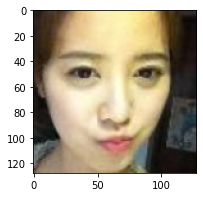

In [ ]:
 # Get random image from Test Dataset
 PredictFaceMask('/content/Face Mask Dataset/Test/WithoutMask/1029.png')

From 2 sample images above, the model can classify whether a person is wearing a mask or not




In [ ]:
# Using HaarCascade, create bounding box for prediction results
mask_label = {
    0: 'MASK',
    1: 'NO MASK'
}

rect_label = {
    0: (0, 255, 0),
    1: (0, 0, 255)
}

In [ ]:
def show_results(p):
    img = cv2.imread(p)
    img = cv2.cvtColor(img, cv2.IMREAD_GRAYSCALE)
    faces = face_detector.detectMultiScale(img,scaleFactor=1.1, minNeighbors=4)

    label = [0 for i in range(len(faces))]
    new_img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR) #colored output image
    counter_masks = {
        'has_mask': 0,
        'no_mask': 0
    }
    for i in range(len(faces)):
        (x,y,w,h) = faces[i]

        crop = new_img[y:y+h,x:x+w]
        crop = cv2.resize(crop,(128,128))
        crop = np.reshape(crop,[1,128,128,3])/255.0

        mask_result = model.predict(crop)
        has_mask = mask_result.argmax()

        if has_mask==0:
            counter_masks['has_mask'] += 1
        else:
            counter_masks['no_mask'] += 1

        cv2.putText(new_img,mask_label[has_mask],(x, y-10),cv2.FONT_HERSHEY_SIMPLEX,0.5,rect_label[has_mask],2)
        cv2.rectangle(new_img,(x,y),(x+w,y+h),rect_label[has_mask],1)

    plt.figure(figsize=(10,10))
    annot1 = f"People with MASKS: {counter_masks['has_mask']};"
    annot2 = f"People with NO MASKS: {counter_masks['no_mask']}."
    cv2.putText(new_img,text=annot1,org=(10, 10),fontFace=cv2.FONT_HERSHEY_TRIPLEX,fontScale=0.5,color=(255, 255, 255),thickness=1)
    cv2.putText(new_img,text=annot2,org=(10, 30),fontFace=cv2.FONT_HERSHEY_TRIPLEX,fontScale=0.5,color=(255, 255, 255),thickness=1)
    plt.imshow(new_img)

## **Using Real-Life Images to Detect Face Mask**

/content/images/maksssksksss75.png
/content/images/maksssksksss844.png
/content/images/maksssksksss814.png
/content/images/maksssksksss120.png
/content/images/maksssksksss781.png
/content/images/maksssksksss226.png
/content/images/maksssksksss161.png
/content/images/maksssksksss583.png
/content/images/maksssksksss839.png
/content/images/maksssksksss335.png
/content/images/maksssksksss558.png
/content/images/maksssksksss190.png
/content/images/maksssksksss247.png
/content/images/maksssksksss474.png
/content/images/maksssksksss524.png
/content/images/maksssksksss484.png
/content/images/maksssksksss426.png
/content/images/maksssksksss212.png
/content/images/maksssksksss730.png


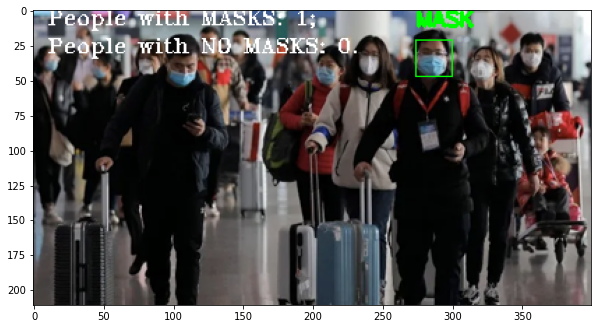

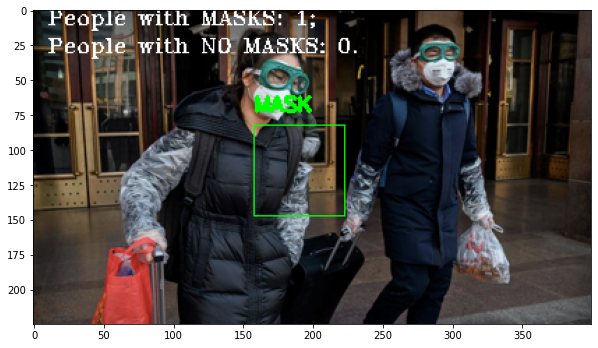

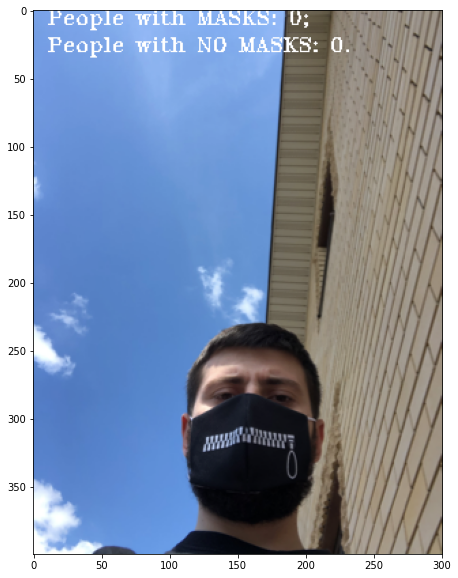

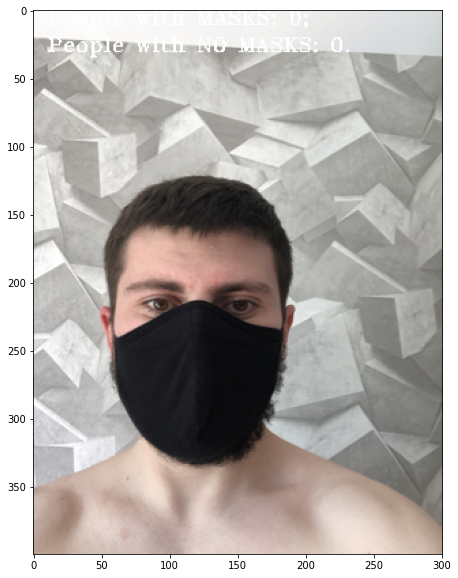

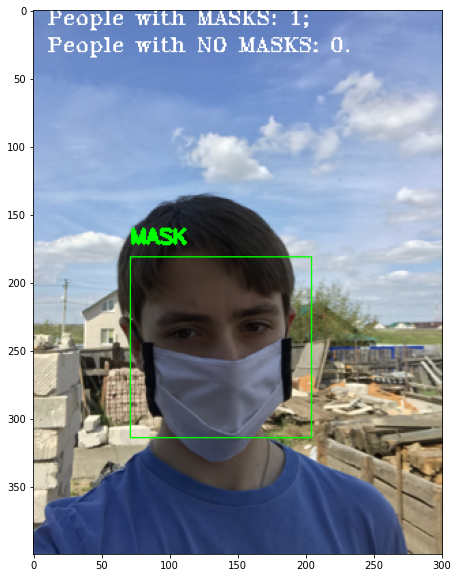

...

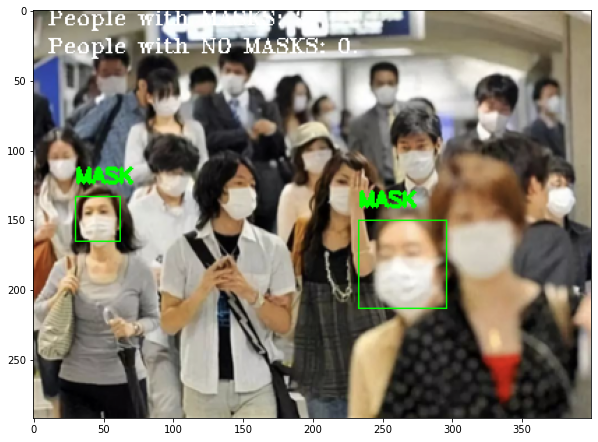

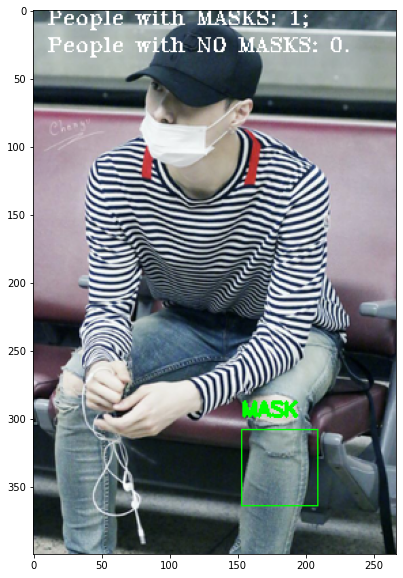

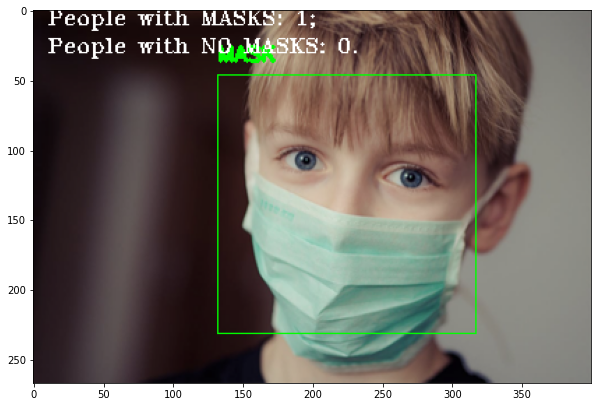

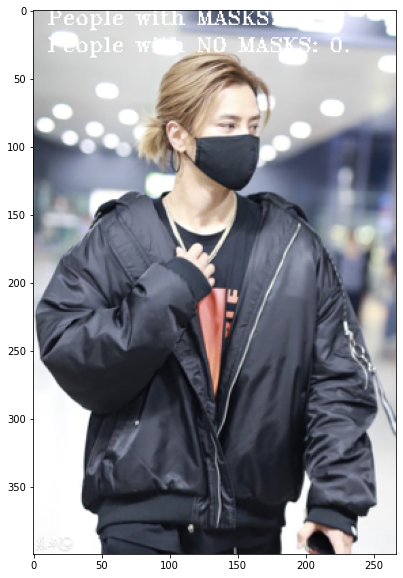

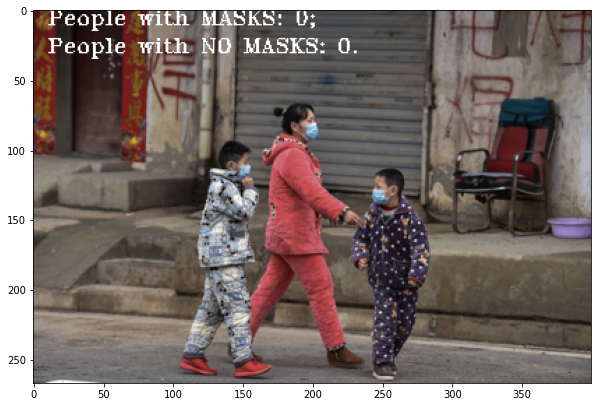

In [ ]:
# Predict with real images
# Create list of images
import os
all_files = []
base_path = '/content/images'
for filename in os.listdir(base_path):
  all_files.append(os.path.join(base_path, filename))

import random
random.shuffle(all_files)

# Make predictions
for image in all_files[:19]:
  print(image)
  show_results(image)


/content/images/maksssksksss37.png
/content/images/maksssksksss21.png
/content/images/maksssksksss537.png
/content/images/maksssksksss29.png
/content/images/maksssksksss581.png
/content/images/maksssksksss96.png


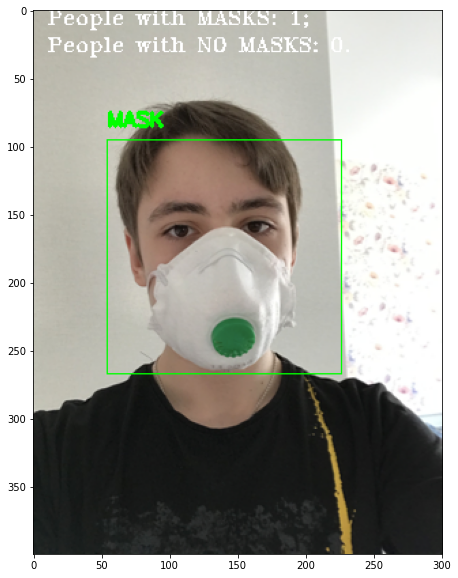

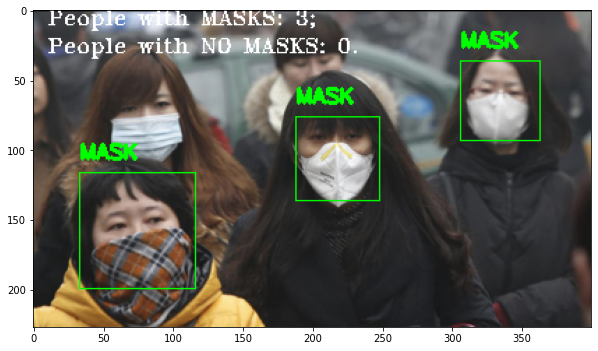

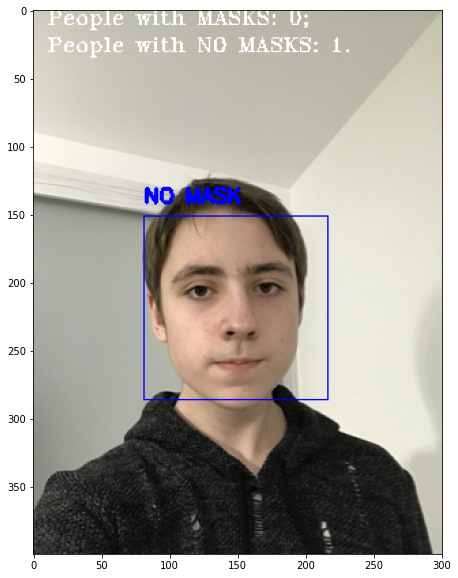

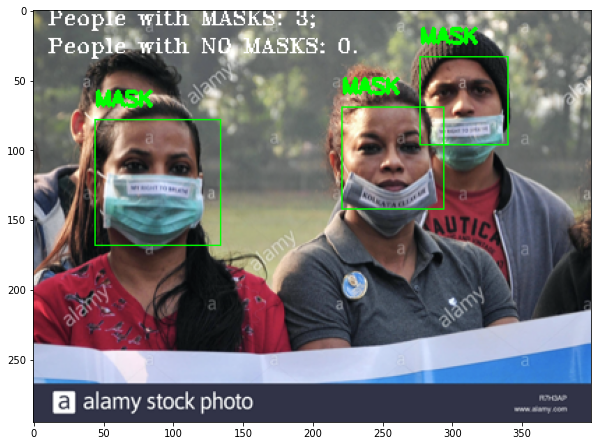

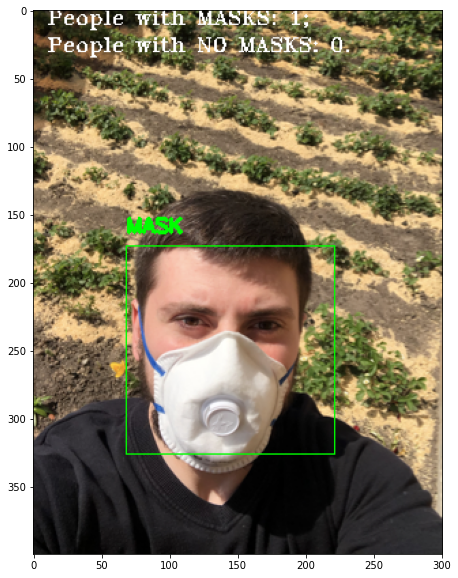

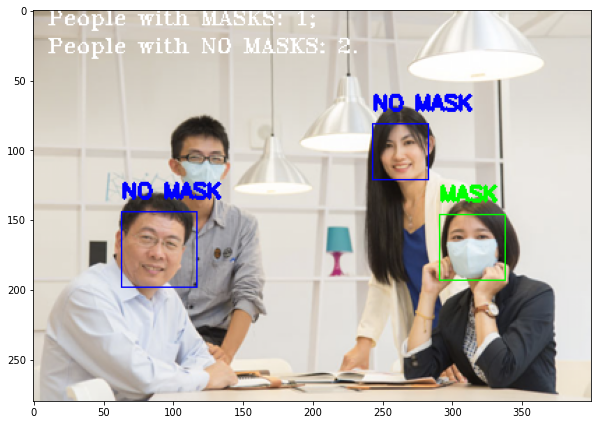

In [ ]:
# Summarized good predictions: predictions that correctly detect face mask or not.
good_preds = [
'/content/images/maksssksksss37.png',
'/content/images/maksssksksss21.png',
'/content/images/maksssksksss537.png',
'/content/images/maksssksksss29.png',
'/content/images/maksssksksss581.png',
'/content/images/maksssksksss96.png']

for p in good_preds:
    print(p)
    show_results(p)

In [ ]:
# Use os.mkdir to create your directories
# You will need a directory, and subdirectories for training
# and testing. These in turn will need subdirectories for 'WITH MASK' and 'WITHOUT MASK'
try:
    os.mkdir("/content/new_Data")
    os.mkdir("/content/new_Data/training")
    os.mkdir("/content/new_Data/testing")
    os.mkdir("/content/new_Data/training/WithMask")
    os.mkdir("/content/new_Data/testing/WithMask")
    os.mkdir("/content/new_Data/training/WithoutMask")
    os.mkdir("/content/new_Data/testing/WithoutMask")
except OSError:
    print("fail")

In [ ]:
# Prepare Image Generator for new data
from shutil import copyfile
import random

def split_data(SOURCE, TRAINING, TESTING, SPLIT_SIZE):
    # YOUR CODE STARTS HERE
    all_files = []

    for filename in os.listdir(SOURCE):
        if os.path.getsize(os.path.join(SOURCE, filename)) > 0:
            all_files.append(filename)
        else:
            print(f"{filename} is skipped as it has zero length")
        
    split_size = SPLIT_SIZE
    file_number = len(all_files)
    shuffled_file = random.sample(all_files, file_number)
    split_point = int(split_size * file_number)

    for filename in shuffled_file[:split_point] :
        copyfile(os.path.join(SOURCE, filename), os.path.join(TRAINING, filename))

    for filename in shuffled_file[split_point:] :
        copyfile(os.path.join(SOURCE, filename), os.path.join(TESTING, filename))
    # YOUR CODE ENDS HERE


WITH_MASK_SOURCE_DIR = '/content/Dataset/WithMask'
TRAINING_WITH_MASK_DIR = "/content/new_Data/training/WithMask/"
TESTING_WITH_MASK_DIR = "/content/new_Data/testing/WithMask/"
WITHOUT_MASK_SOURCE_DIR = "/content/Dataset/WithoutMask"
TRAINING_WITHOUT_MASK_DIR = "/content/new_Data/training/WithoutMask/"
TESTING_WITHOUT_MASK_DIR = "/content/new_Data/testing/WithoutMask/"

split_size = .8
split_data(WITH_MASK_SOURCE_DIR, TRAINING_WITH_MASK_DIR, TESTING_WITH_MASK_DIR, split_size)
split_data(WITHOUT_MASK_SOURCE_DIR, TRAINING_WITHOUT_MASK_DIR, TESTING_WITHOUT_MASK_DIR, split_size)

In [ ]:
# Updating the Model with New Data
new_train_dir = '/content/new_Data/training'
new_train_generator = train_datagen.flow_from_directory(
    directory=new_train_dir,
    target_size=(128,128),
    class_mode='categorical',
    batch_size=BATCH_SIZE
)

new_validation_dir = '/content/new_Data/testing'
new_validation_generator = validation_datagen.flow_from_directory(
    directory=new_validation_dir,
    target_size=(128,128),
    class_mode='categorical',
    batch_size=BATCH_SIZE
)

# update model on new data only with a smaller learning rate
# compile the model
model.compile(optimizer='Adam',
              loss='binary_crossentropy',
              metrics='accuracy')


# fit the model on new data
model.fit(new_train_generator,
          steps_per_epoch= len(new_train_generator)//BATCH_SIZE,
          epochs=50,
          validation_data=new_validation_generator,
          validation_steps=len(new_validation_generator)//BATCH_SIZE,
          callbacks=[callback])

Found 5261 images belonging to 2 classes.
Found 1198 images belonging to 2 classes.
Epoch 1/50
5/5 [==============================] - 2s 313ms/step - loss: 0.1366 - accuracy: 0.9750 - val_loss: 0.0051 - val_accuracy: 1.0000
Epoch 2/50
5/5 [==============================] - 1s 239ms/step - loss: 0.0977 - accuracy: 0.9625 - val_loss: 0.0467 - val_accuracy: 0.9688
Epoch 3/50
5/5 [==============================] - 1s 240ms/step - loss: 0.0434 - accuracy: 0.9937 - val_loss: 0.1104 - val_accuracy: 0.9375
Epoch 4/50
5/5 [==============================] - 1s 239ms/step - loss: 0.1715 - accuracy: 0.9500 - val_loss: 0.0415 - val_accuracy: 0.9688
Epoch 5/50
5/5 [==============================] - 1s 243ms/step - loss: 0.1047 - accuracy: 0.9688 - val_loss: 0.0147 - val_accuracy: 1.0000
Epoch 6/50
5/5 [==============================] - 1s 245ms/step - loss: 0.1336 - accuracy: 0.9625 - val_loss: 0.0252 - val_accuracy: 1.0000
Epoch 7/50
5/5 [==============================] - 1s 238ms/step - loss: 0.07

Prediction result is: [[9.8391217e-01 1.1565051e-04]]


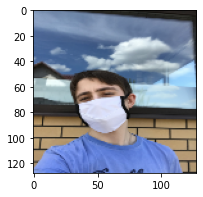

In [ ]:
PredictFaceMask('/content/images/maksssksksss60.png')

/content/images/maksssksksss60.png
/content/images/maksssksksss851.png
/content/images/maksssksksss199.png
/content/images/maksssksksss17.png
/content/images/maksssksksss731.png


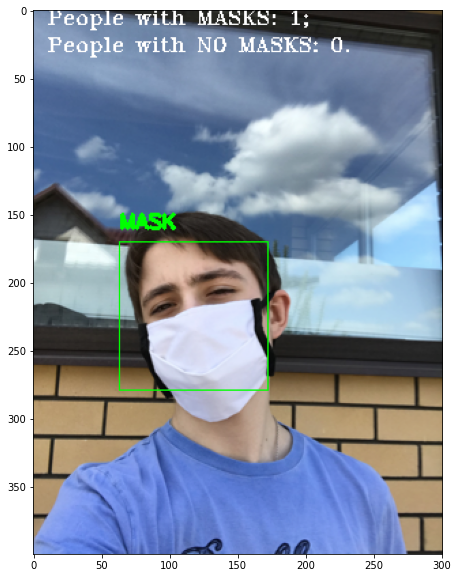

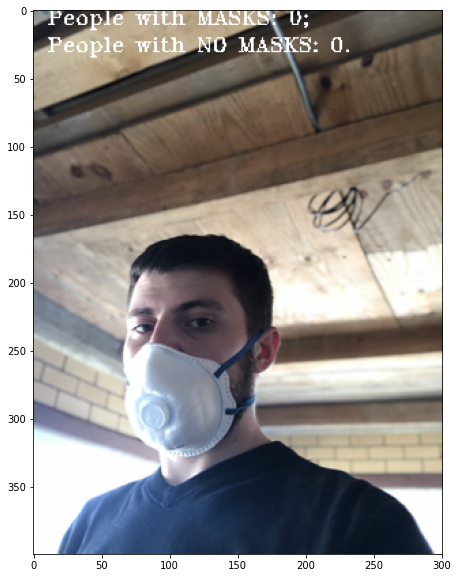

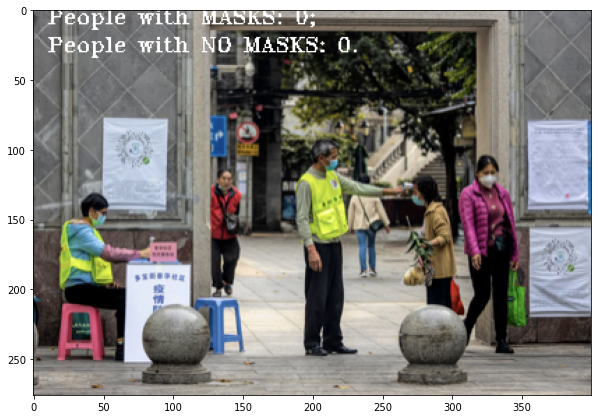

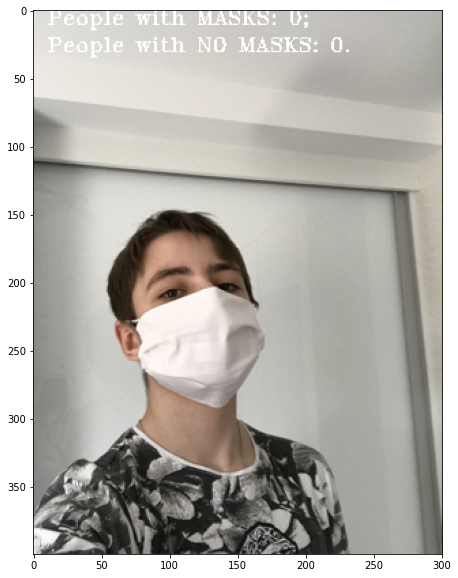

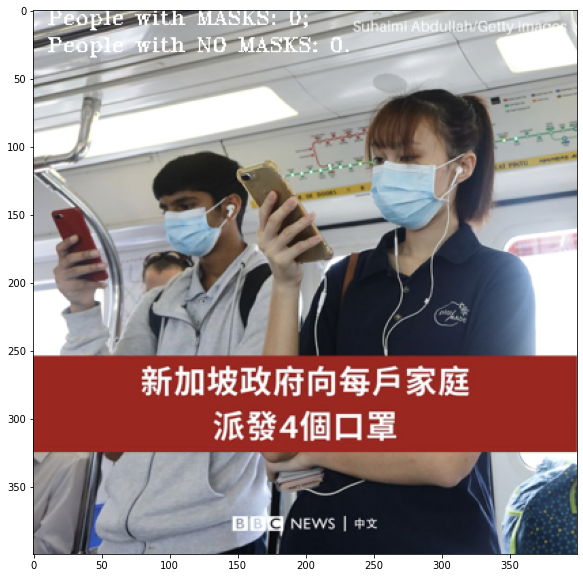

In [ ]:
previous_files= ['/content/images/maksssksksss60.png',
                 '/content/images/maksssksksss851.png',
                 '/content/images/maksssksksss199.png',
                 '/content/images/maksssksksss17.png',
                 '/content/images/maksssksksss731.png']

for p in previous_files:
    print(p)
    show_results(p)